In [ ]:
# install pycaret
!pip install pycaret

In [ ]:
# check installed version
import pycaret
pycaret.__version__

'3.1.0'

In [ ]:
# mount google drive
from google.colab import drive
drive.mount("/content/gdrive")
gold_data_fpath = '/content/gdrive/MyDrive/Sem-I/CMPE-255 Data Mining/Assignments2/gold_price_data.csv'

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# read data
import pandas as pd
gold_data = pd.read_csv(gold_data_fpath)

# check data
gold_data.shape

(10787, 2)

<Axes: >

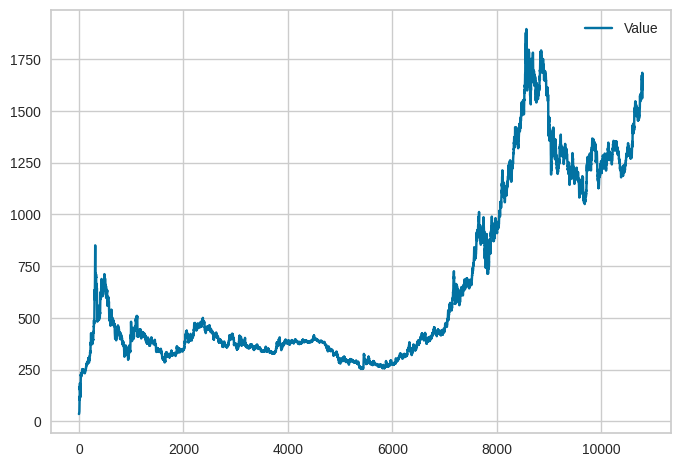

In [ ]:
# plot the dataset
gold_data.plot()

In [ ]:
# review data stats
gold_data.describe

<bound method NDFrame.describe of              Date    Value
0      1970-01-01    35.20
1      1970-04-01    35.10
2      1970-07-01    35.40
3      1970-10-01    36.20
4      1971-01-01    37.40
...           ...      ...
10782  2020-03-09  1672.50
10783  2020-03-10  1655.70
10784  2020-03-11  1653.75
10785  2020-03-12  1570.70
10786  2020-03-13  1562.80

[10787 rows x 2 columns]>

In [ ]:
gold_data['Date']=pd.to_datetime(gold_data['Date'])
#gold_data.set_index('Date', inplace=True, drop=True)
gold_data.describe

<bound method NDFrame.describe of             Date    Value
0     1970-01-01    35.20
1     1970-04-01    35.10
2     1970-07-01    35.40
3     1970-10-01    36.20
4     1971-01-01    37.40
...          ...      ...
10782 2020-03-09  1672.50
10783 2020-03-10  1655.70
10784 2020-03-11  1653.75
10785 2020-03-12  1570.70
10786 2020-03-13  1562.80

[10787 rows x 2 columns]>

In [ ]:
# import pycaret time series and init setup
from pycaret.time_series import *
s = setup(gold_data, target='Value', session_id = 111)

,Description,Value
0,session_id,111
1,Target,Value
2,Approach,Univariate
3,Exogenous Variables,Present
4,Original data shape,"(10787, 2)"
5,Transformed data shape,"(10787, 2)"
6,Transformed train set shape,"(10786, 2)"
7,Transformed test set shape,"(1, 2)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


In [ ]:
# compare baseline models
best = compare_models()

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,TT (Sec)
naive,Naive Forecaster,1.7544,1.0824,33.9333,33.9333,0.0214,0.0209,4.6933
croston,Croston,1.9536,1.2053,37.7876,37.7876,0.0235,0.0233,0.1200
stlf,STLF,2.1339,1.3166,41.2748,41.2748,0.0259,0.0254,0.3867
snaive,Seasonal Naive Forecaster,2.5523,1.5747,49.3667,49.3667,0.0309,0.0303,0.2500
grand_means,Grand Means Forecaster,50.3239,31.0482,973.3822,973.3822,0.5981,0.8535,0.1167


Processing:   0%|          | 0/101 [00:00<?, ?it/s]

In [ ]:
# plot forecast
plot_model(best, plot = 'forecast')

In [ ]:
plot_model(best, plot='ts')

In [ ]:
plot_model(best, plot='cv')

In [ ]:
plot_model(best, plot='diagnostics')

In [ ]:
# save pipeline
save_model(best, 'my_TS_pipeline')

Transformation Pipeline and Model Successfully Saved


(ForecastingPipeline(steps=[('forecaster',
                             TransformedTargetForecaster(steps=[('model',
                                                                 NaiveForecaster())]))]),
 'my_TS_pipeline.pkl')